In [8]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
sns.set()
import pandas as pd
import cv2
from scipy import misc
from resizeimage import resizeimage
from scipy import ndimage
import matplotlib.pyplot as plt
from skimage import data, img_as_float
from skimage.filters import threshold_otsu, threshold_adaptive
import dlib


### Q1 

#### A- Convert it to a grayscale image, and name it as Efes_gray

In [4]:
efes=Image.open(r"Efes.jpg")
efes_array= np.array(efes)

In [5]:
efes_gray_arr=efes_array

for i in range(0,efes_array.shape[0]):
    
    for j in range(0,efes_array.shape[1]):
        
        efes_gray_arr[i,j][0]=efes_array[i,j].mean()

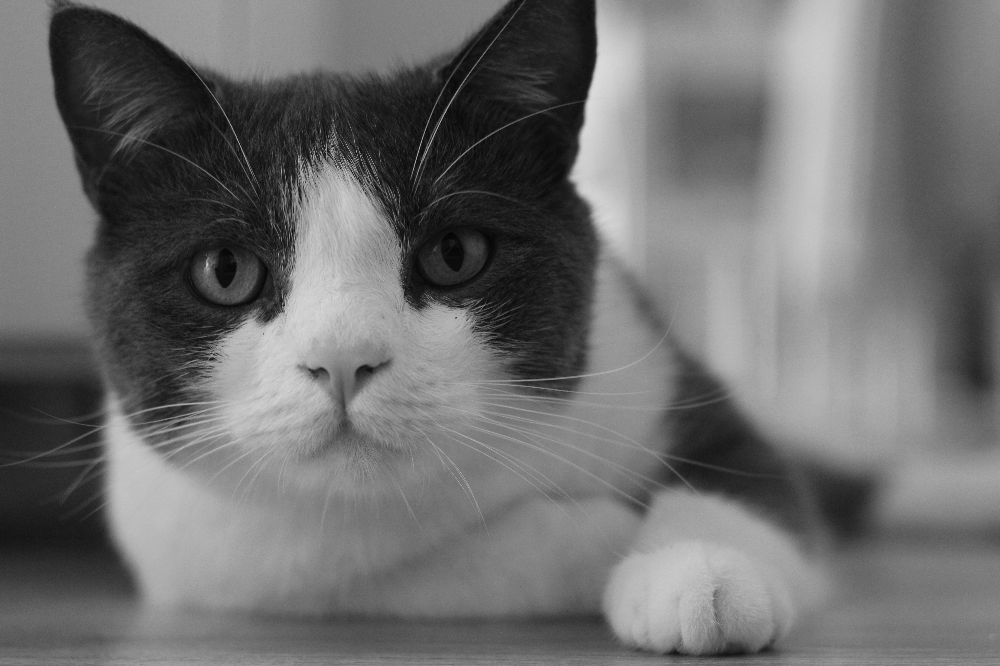

In [6]:
x,y,z=efes_array.shape
efes_gray_arr=efes_gray_arr[...,:1]
efes_gray_arr=efes_gray_arr.reshape(x,y)
Efes_gray=Image.fromarray(efes_gray_arr,'L')
Efes_gray

#### B- Plot 16, 32 and 64-bin-histograms of Efes_gray

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


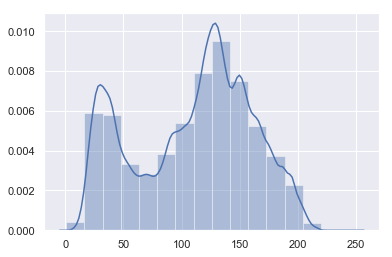

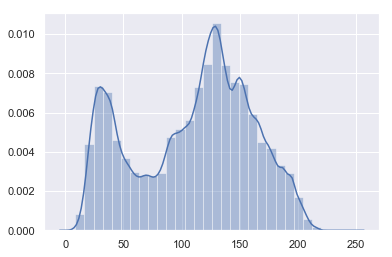

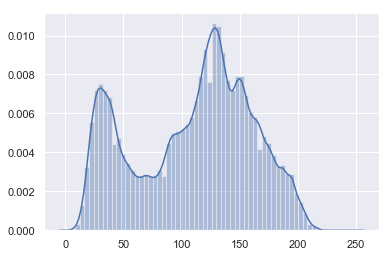

In [7]:
for i in [16,32,64]:
    sns.distplot(efes_gray_arr.ravel(),bins=i)
    plt.show()

#### C- Inspect the histogram and pick a value as a threshold. Obtain a binary image out of Efes_gray using your threshold value and name it as Efes_yourBinary

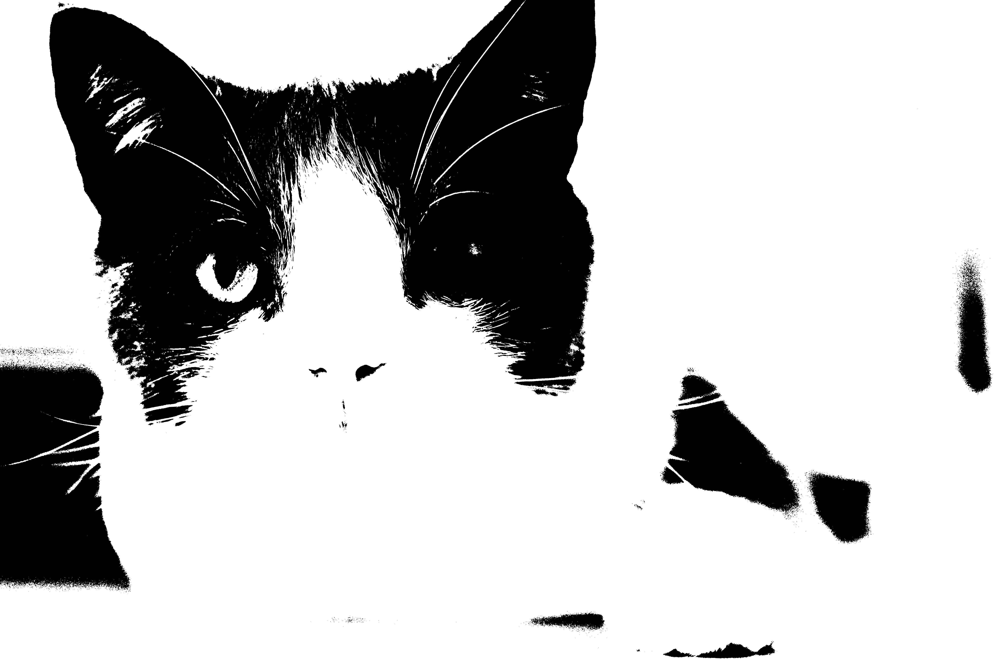

In [8]:
efes_gray_arr_copy=efes_gray_arr.copy()
a,b=efes_gray_arr_copy.shape
for i in range(a):
    for j in range(b):
        if efes_gray_arr_copy[i,j] <65:
            efes_gray_arr_copy[i,j]=0
        else:
            efes_gray_arr_copy[i,j]=255
            
Efes_BurakBinary = Image.fromarray(efes_gray_arr_copy)

Efes_BurakBinary

#### D- Obtain the global theshold value using “Global Thresholding” algorithm and get a binary image using that threshold. Name this image as Efes_GLOBAL

#### E-Now, obtain a threshold value using Otsu’s algorithm and name that image as Efes_OTSU

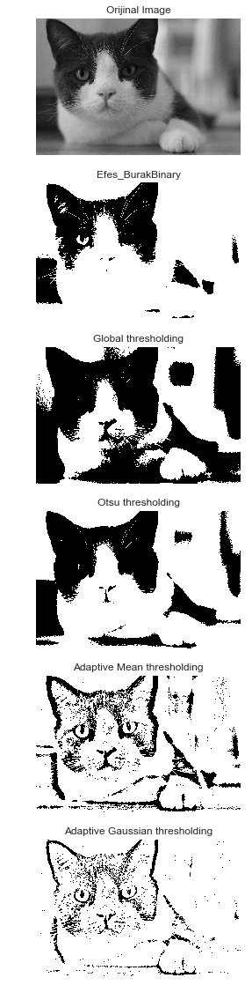

In [7]:
retval_otsu,Efes_OTSU = cv2.threshold(efes_gray_arr,0,255,cv2.THRESH_OTSU)
retval_global,Efes_GLOBAL = cv2.threshold(efes_gray_arr,127,255,cv2.THRESH_BINARY)
Efes_ADAPTIVE_Mean = cv2.adaptiveThreshold(efes_gray_arr,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,307,10)
Efes_ADAPTIVE_Gaussian = cv2.adaptiveThreshold(efes_gray_arr,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,307,10)

fig, axes = plt.subplots(nrows=6, figsize=(20, 20))
ax0, ax1, ax2,ax3,ax4,ax5 = axes
plt.gray()

ax0.imshow(efes_gray_arr)
ax0.set_title('Orijinal Image')

ax1.imshow(efes_gray_arr_copy)
ax1.set_title('Efes_BurakBinary')

ax2.imshow(Efes_GLOBAL)
ax2.set_title('Global thresholding')

ax3.imshow(Efes_OTSU)
ax3.set_title('Otsu thresholding')

ax4.imshow(Efes_ADAPTIVE_Mean)
ax4.set_title('Adaptive Mean thresholding')

ax5.imshow(Efes_ADAPTIVE_Gaussian)
ax5.set_title('Adaptive Gaussian thresholding')

for ax in axes:
    ax.axis('off')

plt.show()

### F-Compare Efes_yourBinary, Efes_GLOBAL and Efes_OTSU. Comment.

As we can observe in histogram this image can be called as bimodal image. So it is great for otsu threshold. We can easly observe that global threshold is much more noisy then otsu threshold. Also I added some adaptive thresholds too. It mush more works like filter. 

### Form a 5 x 5 pixels square structuring element, S, built up of all 1’s. Using this structuring element, S, 

### G- Perform dilation operations on
####       1. Efes_yourBinary 
####       2. Efes_GLOBAL 
####       3. Efes_OTSU

In [8]:
def dilation(img_array,p1=5,p2=5,iteration=1):
    kernel = np.ones((p1,p2),np.uint8)
    dilation = cv2.dilate(img_array,kernel,iterations = iteration)
    return (dilation)

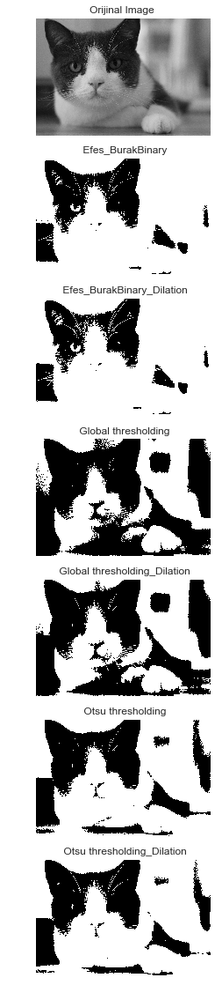

In [9]:
fig, axes = plt.subplots(nrows=7, figsize=(20, 20))
ax0, ax1, ax2,ax3,ax4,ax5,ax6, = axes
plt.gray()

ax0.imshow(efes_gray_arr)
ax0.set_title('Orijinal Image ')


ax1.imshow(efes_gray_arr_copy)
ax1.set_title('\n Efes_BurakBinary')

ax2.imshow(dilation(efes_gray_arr_copy))
ax2.set_title('\n Efes_BurakBinary_Dilation')

ax3.imshow(Efes_GLOBAL)
ax3.set_title('\n Global thresholding')

ax4.imshow(dilation(Efes_GLOBAL))
ax4.set_title('\n Global thresholding_Dilation')

ax5.imshow(Efes_OTSU)
ax5.set_title('\n Otsu thresholding')

ax6.imshow(dilation(Efes_OTSU))
ax6.set_title('\n Otsu thresholding_Dilation')

for ax in axes:
    ax.axis('off')

plt.show()

###  H-Perform erosion operations on
####       1. Efes_yourBinary 
####       2. Efes_GLOBAL 
####       3. Efes_OTSU

In [10]:
def erosion(img_array,p1=5,p2=5,iteration=1):
    kernel = np.ones((p1,p2),np.uint8)
    erosion = cv2.erode(img_array,kernel,iterations = iteration)
    return (erosion)

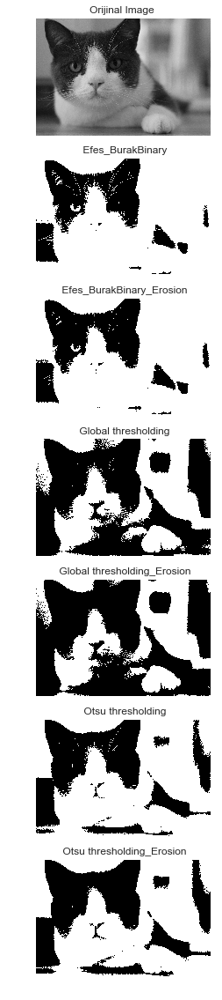

In [11]:
fig, axes = plt.subplots(nrows=7, figsize=(20, 20))
ax0, ax1, ax2,ax3,ax4,ax5,ax6, = axes
plt.gray()

ax0.imshow(efes_gray_arr)
ax0.set_title('Orijinal Image ')


ax1.imshow(efes_gray_arr_copy)
ax1.set_title('\n Efes_BurakBinary')

ax2.imshow(erosion(efes_gray_arr_copy))
ax2.set_title('\n Efes_BurakBinary_Erosion')

ax3.imshow(Efes_GLOBAL)
ax3.set_title('\n Global thresholding')

ax4.imshow(erosion(Efes_GLOBAL))
ax4.set_title('\n Global thresholding_Erosion')

ax5.imshow(Efes_OTSU)
ax5.set_title('\n Otsu thresholding')

ax6.imshow(erosion(Efes_OTSU))
ax6.set_title('\n Otsu thresholding_Erosion')

for ax in axes:
    ax.axis('off')

plt.show()

###  I-Develop a structuring element and a method to locate the “eyes” of the cat

In [36]:
Efes_ADAPTIVE_Mean = cv2.adaptiveThreshold(efes_gray_arr,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,307,40)
Efes_ADAPTIVE_Mean2 = cv2.adaptiveThreshold(efes_gray_arr,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,307,10)
Efes_ADAPTIVE_Gaussian = cv2.adaptiveThreshold(efes_gray_arr,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,307,10)

In [39]:
#efes=Image.open(r"Efes.jpg")
#img= np.array(efes)
#gray_u = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#gray_u=Efes_ADAPTIVE_Mean2+(255-Efes_ADAPTIVE_Mean)
#gray_u=np.array(Efes_ADAPTIVE_Gaussian)
#gray_u=erosion(gray_u)
#gray_u=dilation(gray_u,p1=7,p2=7)
#gray_u = cv2.GaussianBlur(gray_u,(11,11),0)

In [368]:

#gray_u = cv2.equalizeHist(gray_u)
#gray_u = np.hstack((gray_u,equ)) #stacking images side-by-side

In [492]:
#clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
#gray_u = clahe.apply(gray_u)
#gray_u = cv2.medianBlur(gray_u,5)

#gray_u = cv2.equalizeHist(gray_u)

In [44]:
#plt.imshow(gray_u)

In [41]:
import numpy as np
import cv2

# multiple cascades: https://github.com/Itseez/opencv/tree/master/data/haarcascades

#https://github.com/Itseez/opencv/blob/master/data/haarcascades/haarcascade_frontalface_default.xml
#face_cascade = cv2.CascadeClassifier('haarcascade_frontalcatface_extended.xml')
#https://github.com/Itseez/opencv/blob/master/data/haarcascades/haarcascade_eye.xml
#eye_cascade = cv2.CascadeClassifier('haarcascade_eye.xml')



#efes=Image.open(r"face.jpg")
#img= np.array(efes)

#Umat_form=cv2.UMat(img)


#gray_u=np.array(efes)
#gray_u = cv2.GaussianBlur(gray_u,(9,9),100000)

#gray_u = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

#faces = face_cascade.detectMultiScale(gray_u, 1.3, 5)
#eyes = eye_cascade.detectMultiScale(gray_u, 1.3, 5,)
HoughCircles = cv2.HoughCircles(gray_u, cv2.HOUGH_GRADIENT, dp=1.2,minDist= 1, param1=128,param2=100, minRadius=320, maxRadius=450)
#for (x,y,w,h) in faces:
#    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
#    #roi_gray = gray_u[y:y+h, x:x+w]
#    #roi_color = img[y:y+h, x:x+w]
#    
#eyes = eye_cascade.detectMultiScale(gray_u)
#for (ex,ey,ew,eh) in eyes:
#    cv2.rectangle(img,(ex,ey),(ex+ew,ey+eh),(0,255,0),2)
#    
#for (ex,ey,ew,eh) in HoughCircles:
#    cv2.rectangle(img,(ex,ey),(ex+ew,ey+eh),(0,255,0),2)
    
circles = np.uint16(np.around(HoughCircles))
for i in circles[0,:]:
    # draw the outer circle
    cv2.circle(img,(i[0],i[1]),i[2],(0,255,0),2)

cv2.imshow('img',img)



cv2.destroyAllWindows()

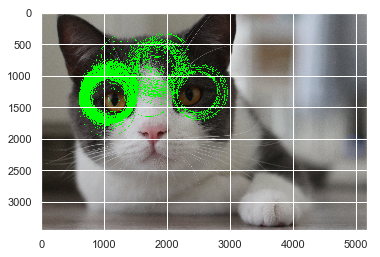

In [42]:
plt.imshow(img)

### Q2

### A What’s the difference between “image processing” and “computer vision”?

### Image Processing:

1. Obtain image from different resources
2. Observe them just as a numbers
3. Perform the process like filtering, thresholding, enhancement etc.
4. Detect objects

### Computer Vision:

1. Computer vision focus on name the detected objects
2. Like it named we give computer vision to comprehend image with means

### A-Are these classes linearly separable, or not? 

No it is not linearly separable. Linearly seperable means that just with one linear line you can seperate two groups. However as it is clearly seen we have some points which are interlocked.

### B- Propose and implement a method to find a linear classifier to classify them. On the same scatter plot, plot the separating hyperplane you find with your method. You may use your favorite programming language for implementation. Provide your codes

In [15]:
c1=pd.read_csv("C1__pts.txt",header=None,skiprows=3,skipinitialspace=True,delimiter="\s+",names =["x_1","x_2"])
c2=pd.read_csv("C2__pts.txt",header=None,skiprows=3,skipinitialspace=True,delimiter="\s+",names =["x_1","x_2"])

In [16]:
c1["class"]=0
c2["class"]=1

In [17]:
df=c1.append(c2,ignore_index=True)

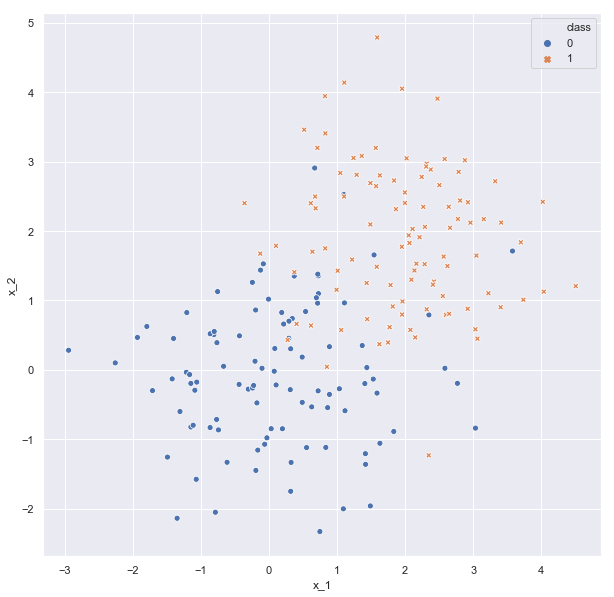

In [18]:
fig, ax = plt.subplots(figsize=(10,10)) 

ax = sns.scatterplot(x="x_1", y="x_2", data=df,hue="class", style="class")


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\stochastic_gradient.py:183: FutureWarning: max_iter and tol parameters have been added in SGDClassifier in 0.19. If max_iter is set but tol is left unset, the default value for tol in 0.19 and 0.20 will be None (which is equivalent to -infinity, so it has no effect) but will change in 0.21 to 1e-3. Specify tol to silence this warning.
  FutureWarning)


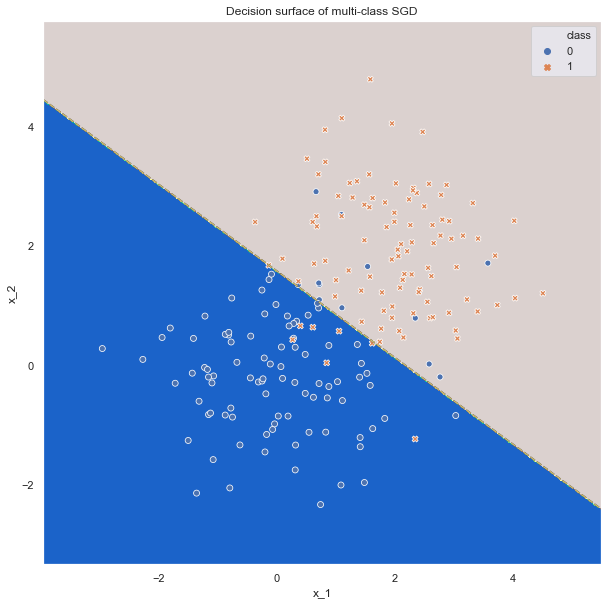

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.linear_model import SGDClassifier
fig, ax = plt.subplots(figsize=(10,10)) 
# import some data to play with
iris = datasets.load_iris()

# we only take the first two features. We could
# avoid this ugly slicing by using a two-dim dataset
X = df.iloc[:, :2]
y = df.iloc[:, -1]
X = X.values
colors = "ky"

# shuffle
idx = np.arange(X.shape[0])
np.random.seed(13)
np.random.shuffle(idx)
X = X[idx]
y = y[idx]


h = .02  # step size in the mesh

clf = SGDClassifier(alpha=0.001, max_iter=100).fit(X, y)

# create a mesh to plot in
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                     np.arange(y_min, y_max, h))

# Plot the decision boundary. For that, we will assign a color to each
# point in the mesh [x_min, x_max]x[y_min, y_max].
Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
# Put the result into a color plot
Z = Z.reshape(xx.shape)
cs = plt.contourf(xx, yy, Z, cmap=plt.cm.terrain)
plt.axis('tight')

target_names=[1,2]
# Plot also the training points
#for i, color in zip(clf.classes_, colors):
#    idx = np.where(y == i)
#    plt.scatter(X[idx, 0], X[idx, 1], c=color, label=target_names[i],
#                cmap=plt.cm.terrain, edgecolor='black', s=20)
ax = sns.scatterplot(x="x_1", y="x_2", data=df,hue="class", style="class")
plt.title("Decision surface of multi-class SGD")
plt.axis('tight')

# Plot the three one-against-all classifiers
xmin, xmax = plt.xlim()
ymin, ymax = plt.ylim()
coef = clf.coef_
intercept = clf.intercept_


def plot_hyperplane(c, color):
    def line(x0):
        return (-(x0 * coef[0, 0]) - intercept) / coef[0, 1]

    plt.plot([xmin, xmax], [line(xmin), line(xmax)],
             ls="--",c=color)


for i, color in zip(clf.classes_, colors):
    plot_hyperplane(i, color)
plt.legend()
plt.show()

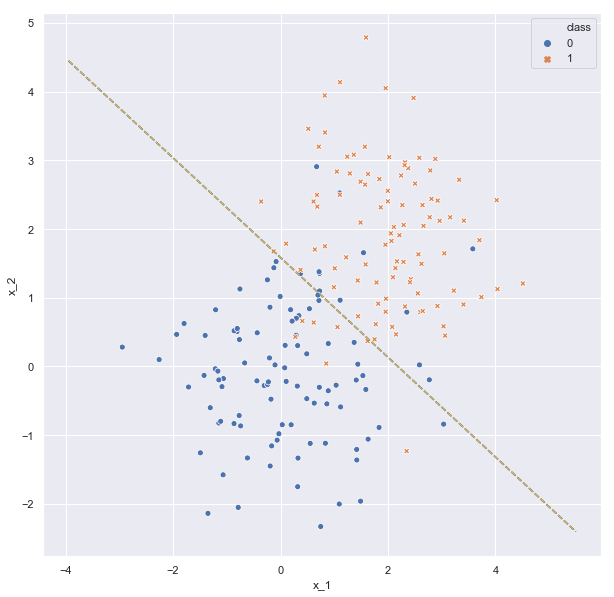

In [26]:
fig, ax = plt.subplots(figsize=(10,10)) 

ax = sns.scatterplot(x="x_1", y="x_2", data=df,hue="class", style="class")
def plot_hyperplane(c, color):
    def line(x0):
        return (-(x0 * coef[0, 0]) - intercept) / coef[0, 1]

    plt.plot([xmin, xmax], [line(xmin), line(xmax)],
             ls="--",c=color)


for i, color in zip(clf.classes_, colors):
    plot_hyperplane(i, color)
plt.legend()
plt.show()

# Extra Study

In [9]:
import numpy as np
import cv2

# multiple cascades: https://github.com/Itseez/opencv/tree/master/data/haarcascades

#https://github.com/Itseez/opencv/blob/master/data/haarcascades/haarcascade_frontalface_default.xml
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
#https://github.com/Itseez/opencv/blob/master/data/haarcascades/haarcascade_eye.xml
eye_cascade = cv2.CascadeClassifier('haarcascade_eye.xml')

cap = cv2.VideoCapture(0)

while 1:
    ret, img = cap.read()
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)

    for (x,y,w,h) in faces:
        cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
        roi_gray = gray[y:y+h, x:x+w]
        roi_color = img[y:y+h, x:x+w]
        
        eyes = eye_cascade.detectMultiScale(roi_gray)
        for (ex,ey,ew,eh) in eyes:
            cv2.rectangle(roi_color,(ex,ey),(ex+ew,ey+eh),(0,255,0),2)

    cv2.imshow('img',img)
    k = cv2.waitKey(30) & 0xff
    if k == 27:
        break

cap.release()
cv2.destroyAllWindows()